# Línea base de mediciones de CO2 - Smart Citizen

Este notebook muestra el proceso que se siguió para calcular la línea base de mediciones de CO2 equivalente en los sensores [Smart Citizen](https://smartcitizen.me/kits/). Los datos con los que se trabaja fueron recopilados del portal de la api de Smart Citizen y se encuentran guardados en la base de datos del proyecto [Prototipos de Infraestructura Pública para una Ciudad del Futuro](https://pipciudadfuturo.com/).

El notebook consta de las siguientes partes:

+ Librerías utilizadas
+ Descarga de datos
+ Visualización de datos

## Librerías

Para interactuar con la base de datos y generar el procesmiento de los diferentes datos hemos desarrollado una librería propia `aqiGDL` que almacena las diferentes funciones que son requeridas para el trabajo. Además de la librería desarrollada por [LAC](https://lac.mx) para el proyecto, también se utilizan otras librerías de python para el análisis y visualización de datos.

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    import aqiGDL
%matplotlib inline

import datetime
import textwrap

/home/edgar/anaconda3/envs/geo_env/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(


### Estilos visuales
Utilizamos el estilo visual "Pitaya Smoothie" para la generación de gráficas.

In [2]:
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')
colors = ['7A76C2', 'ff6e9c98', 'f62196', '18c0c4', 'f3907e', '66E9EC']

## Descarga de datos

### Datos históricos de calidad del aire registrados por los sensores

Los datos históricos de exposición a contaminantes atmosféricos durante desplazamientos han sido descargados desde la api de Smart Citizen. Actualmente los datos están disponibles desde la base de datos de PIP.

In [98]:
gdf = aqiGDL.gdf_from_db('smartcitizen', 'public')
gdf.head(2)

,device_id,param,unit,lon,lat,date,value,geometry
0,13483,Total Volatile Organic Compounds Digital Indoo...,ppb,-103.351588,20.685147,2021-03-03T15:00:38Z,23628.451613,POINT (671692.111 2288175.175)
1,13483,Total Volatile Organic Compounds Digital Indoo...,ppb,-103.351588,20.685147,2021-03-03T14:00:08Z,29206.000000,POINT (671692.111 2288175.175)


De los parámetros que se miden por Smart Citizen el que se va a utilizar para la construcción de la línea base será el de dióxido de carbono equivalente, medido en partes por millón (ppm).

In [99]:
gdf.loc[gdf.param=='Equivalent Carbon Dioxide Digital Indoor Sensor'].head(2)

,device_id,param,unit,lon,lat,date,value,geometry
1005,13483,Equivalent Carbon Dioxide Digital Indoor Sensor,ppm,-103.351588,20.685147,2021-03-03T15:00:38Z,13147.709677,POINT (671692.111 2288175.175)
1006,13483,Equivalent Carbon Dioxide Digital Indoor Sensor,ppm,-103.351588,20.685147,2021-03-03T14:00:08Z,24498.172414,POINT (671692.111 2288175.175)


### Red vial de Guadalajara

Con [OSMnx](https://osmnx.readthedocs.io/en/stable/) se descarga la red vial para el área de los sensores

In [4]:
G = ox.graph_from_bbox(20.7900,20.523110,-103.2400,-103.4700)
edges = ox.graph_to_gdfs(G, nodes=False)

### GeoDataFrame con ubicación de sensores

A partir de la tabla que se encuentra en la base de datos de PIP podemos hacer una agrupación por identificador del dispositivo de medición, al agrupar esta obtenemos las coordenadas de cada dispositivo. Al guardar estos datos en una nueva tabla podemos acceder a las ubicacioens más adelante.

In [5]:
gdf_est = gdf[['device_id','lon','lat']].groupby('device_id').mean()
gdf_est = gpd.GeoDataFrame(
    gdf_est, geometry=gpd.points_from_xy(gdf_est.lon, gdf_est.lat))
gdf_est.head(2)

,lon,lat,geometry
device_id,,,
13483,-103.351588,20.685147,POINT (-103.35159 20.68515)
13492,-103.389891,20.651647,POINT (-103.38989 20.65165)


In [76]:
def graph_smartcitizen(device, param, gdf, gdf_est, edges, save=False):

    fig, axes = plt.subplots(1,2,figsize=(24,8), sharex=True)

    df_temp = gdf[(gdf['device_id']==device) & (gdf['param']==param)].copy()
    df_temp['date'] = pd.to_datetime(df_temp['date'])
    df_temp.set_index('date',inplace=True)
    df_temp = df_temp.resample('D').mean()
    axes[1].scatter(df_temp.index, df_temp['value'], label=param)
    axes[1].plot(df_temp.index, df_temp['value'], '--', zorder=1, color='white', alpha=0.35)
    
    df_std = gdf[(gdf['device_id']==device) & (gdf['param']==param)].copy()
    df_std['date'] = pd.to_datetime(df_std['date'])
    df_std.set_index('date',inplace=True)
    df_std = df_std.resample('D').std()
    axes[1].errorbar(df_std.index, df_temp['value'], df_std['value'], linestyle='None', zorder=2, color='red', alpha=0.35)
    
    title = textwrap.fill(param, 35)
    axes[1].set_title(title,fontsize=20)
    axes[1].tick_params(axis='x',labelrotation=45)


    x_ticks = np.arange(0, len(df_temp.index),15)

    a00 = axes[0]
    shax = a00.get_shared_x_axes()
    shax.remove(a00)
    edges.plot(ax=axes[0], color='#e8e9eb',linewidth=0.1, zorder=-1)
    edges[(edges['highway']=='primary') | (edges['highway']=='secondary')].plot(ax=axes[0], color='#e8e9eb',linewidth=0.5, zorder=0)
    gdf_est.plot(ax=axes[0], color='k', alpha=0.85, zorder=1)
    gdf_est[gdf_est.index==device].plot(ax=axes[0], color='#ba0d38', alpha=0.85, zorder=2, markersize=90)
    axes[0].axis('off')
    estacion = device
    fecha_1 = df_temp.index.min().strftime("%Y-%m-%d")
    fecha_2 = df_temp.index.max().strftime("%Y-%m-%d")
    fig.suptitle(f'Device: {estacion}\n{fecha_1} -- {fecha_2}', fontsize=30)

    if save==True:
        plt.savefig(f'{device}_{fecha_1}_{fecha_2}.png',dpi=300)

    return plt.show()

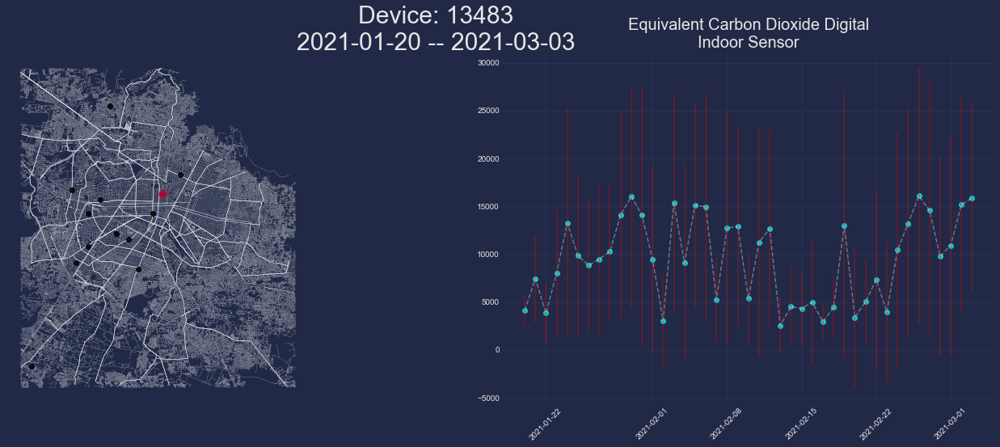

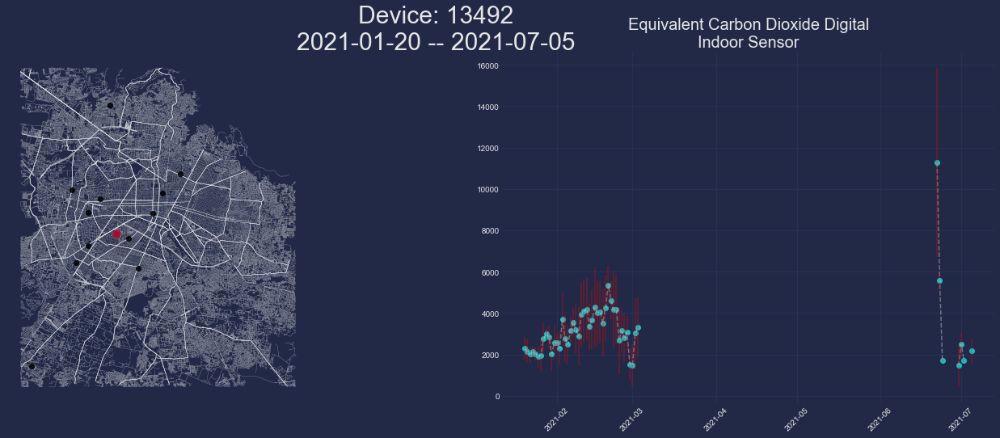

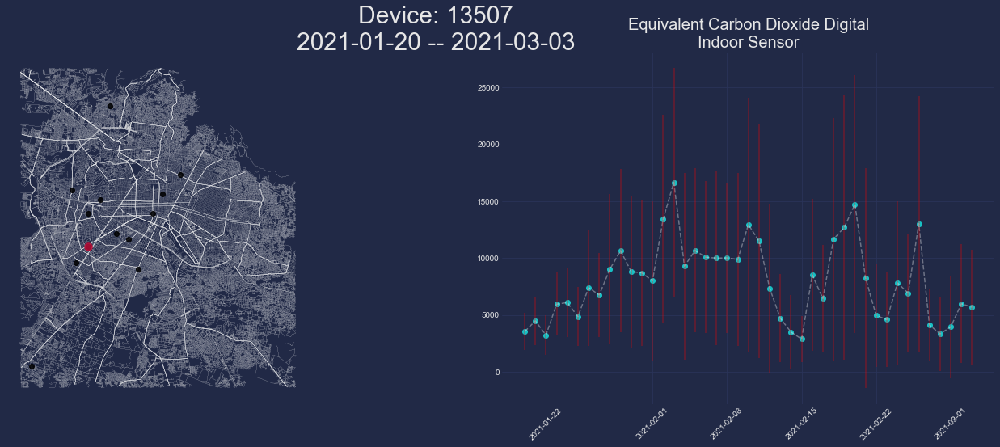

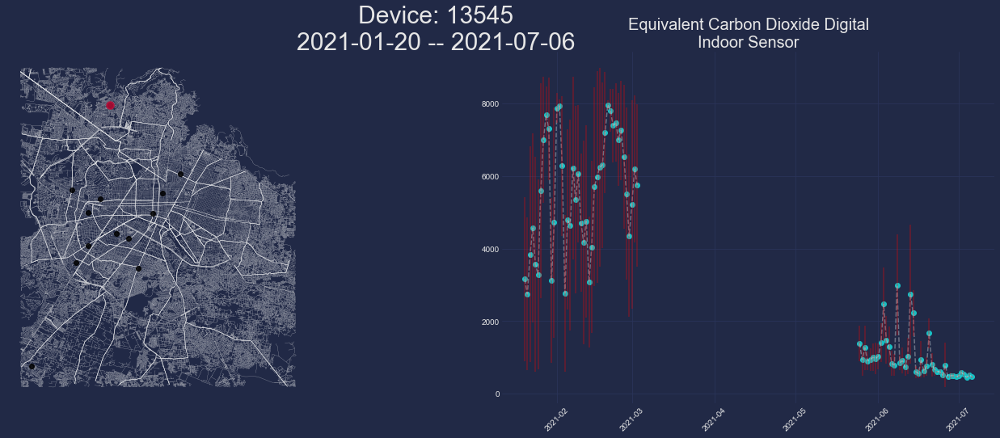

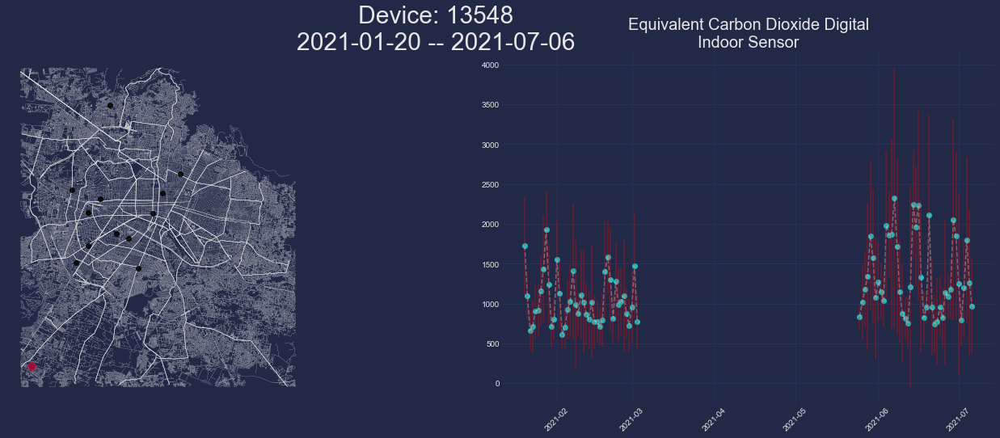

...

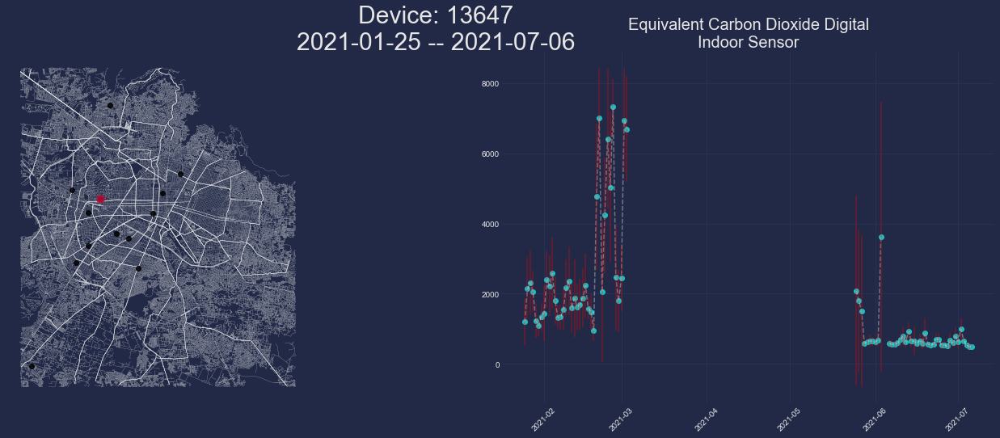

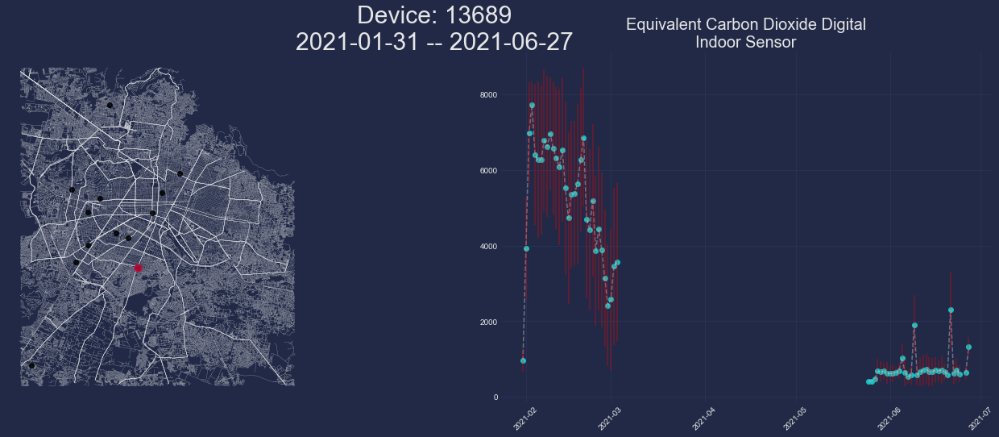

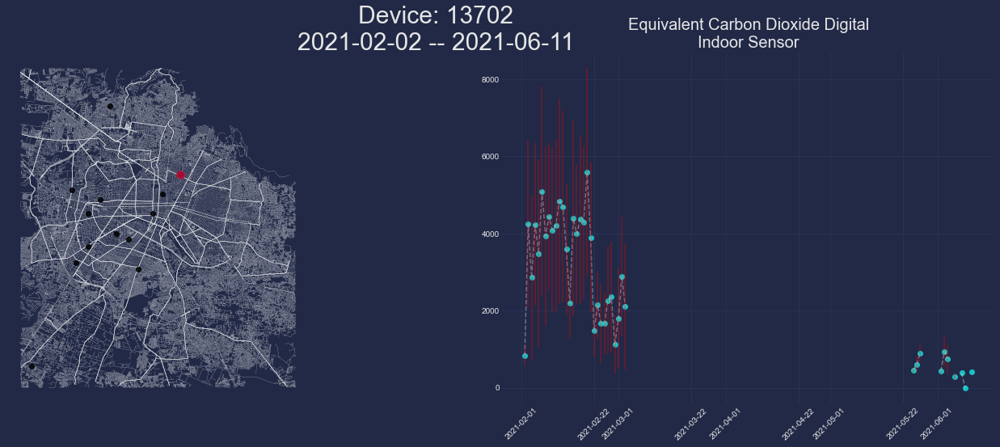

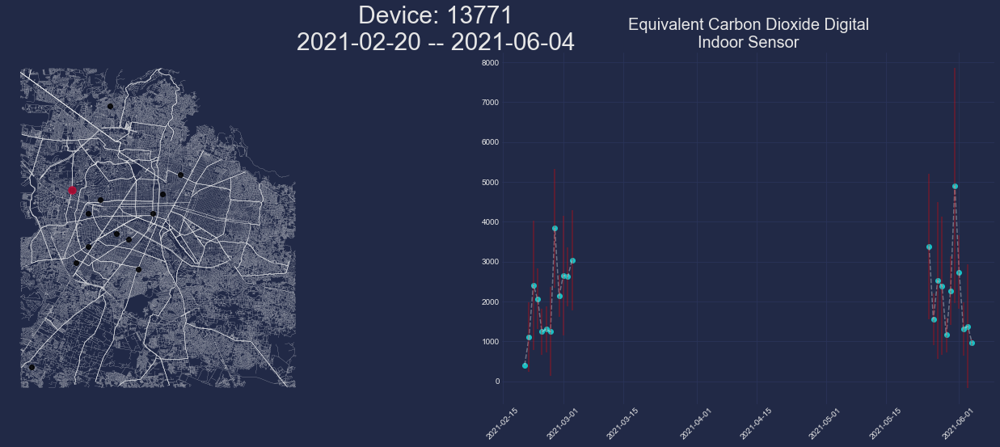

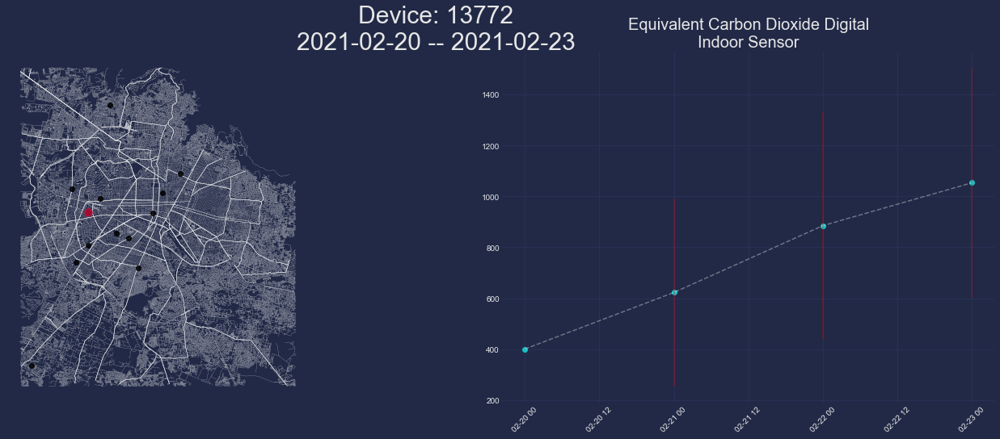

In [77]:
param = 'Equivalent Carbon Dioxide Digital Indoor Sensor'

for est in gdf.device_id.unique():
    
    graph_smartcitizen(est, param, gdf, gdf_est, edges, save=False)
    

In [48]:
param = 'Equivalent Carbon Dioxide Digital Indoor Sensor'
device = 13483

df_temp = gdf[(gdf['device_id']==device) & (gdf['param']==param)].copy()
df_temp['date'] = pd.to_datetime(df_temp['date'])
df_temp.set_index('date',inplace=True)
df_temp = df_temp.resample('D').agg({'value':['mean','std']})
df_temp.reset_index(inplace=True)
df_temp['date'] = df_temp['date'].dt.date
df_temp.head(2)

date        value             
                      mean          std
0  2021-01-20  4111.079197  1605.759494
1  2021-01-21  7431.553512  4536.059420

In [49]:
datelimit = pd.to_datetime("2021-04-01").date()
df_time1 = df_temp[df_temp['date']<datelimit].dropna()
df_time1.head(5)

date         value              
                       mean           std
0  2021-01-20   4111.079197   1605.759494
1  2021-01-21   7431.553512   4536.059420
2  2021-01-22   3828.973050   3108.296827
3  2021-01-23   8023.340775   6579.307186
4  2021-01-24  13259.153362  11924.483982

In [50]:
len(df_temp[df_temp['date']>datelimit])

0

In [43]:
def multigraph_smartcitizen(device, param, gdf, gdf_est, edges, save=False):

    #fig, axes = plt.subplots(1,3,figsize=(24,8), sharey=True)
    fig, axes = plt.subplots(1,3,figsize=(24,8))
    
    df_temp = gdf[(gdf['device_id']==device) & (gdf['param']==param)].copy()
    df_temp['date'] = pd.to_datetime(df_temp['date'])
    df_temp.set_index('date',inplace=True)
    df_temp = df_temp.resample('D').agg({'value':['mean','std']})
    df_temp.reset_index(inplace=True)
    df_temp['date'] = df_temp['date'].dt.date
    
    datelimit = pd.to_datetime("2021-04-01").date()
    
    #first period
    df_time1 = df_temp[df_temp['date']<datelimit].dropna()
    axes[1].scatter(df_time1.date, df_time1['value']['mean'], label=param)
    axes[1].plot(df_time1.date, df_time1['value']['mean'], '--', zorder=1, color='white', alpha=0.35)
    axes[1].errorbar(df_time1.date, df_time1['value']['mean'], df_time1['value']['std'], elinewidth=3, linestyle='None', zorder=2, alpha=0.35)
    
    axes[1].tick_params(axis='x',labelrotation=45)
    
    axes[1].get_shared_y_axes().join(axes[1], axes[2])

    
    #second period
    df_time2 = df_temp[df_temp['date']>datelimit].dropna()
    axes[2].scatter(df_time2.date, df_time2['value']['mean'], label=param)
    axes[2].plot(df_time2.date, df_time2['value']['mean'], '--', zorder=1, color='white', alpha=0.35)
    axes[2].errorbar(df_time2.date, df_time2['value']['mean'], df_time2['value']['std'], linestyle='None', zorder=2, alpha=0.35)
    
    axes[2].tick_params(axis='x',labelrotation=45)
    axes[2].axes.get_yaxis().set_visible(False)
    
    
    #title = textwrap.fill(param, 35)
    #x_ticks = np.arange(0, len(df_time1.date),15)

    a00 = axes[0]
    shay = a00.get_shared_y_axes()
    shay.remove(a00)
    
    '''edges.plot(ax=axes[0], color='#e8e9eb',linewidth=0.1, zorder=-1)
    edges[(edges['highway']=='primary') | (edges['highway']=='secondary')].plot(ax=axes[0], color='#e8e9eb',linewidth=0.5, zorder=0)
    gdf_est.plot(ax=axes[0], color='k', alpha=0.85, zorder=1)
    gdf_est[gdf_est.index==device].plot(ax=axes[0], color='#ba0d38', alpha=0.85, zorder=2, markersize=90)
    axes[0].axis('off')
    estacion = device
    fecha_1 = df_temp.date.min().strftime("%Y-%m-%d")
    fecha_2 = df_temp.date.max().strftime("%Y-%m-%d")
    fig.suptitle(f'Device: {estacion}\n{fecha_1} -- {fecha_2}', fontsize=30)'''

    if save==True:
        plt.savefig(f'{device}_{fecha_1}_{fecha_2}.png',dpi=300)

    return plt.show()

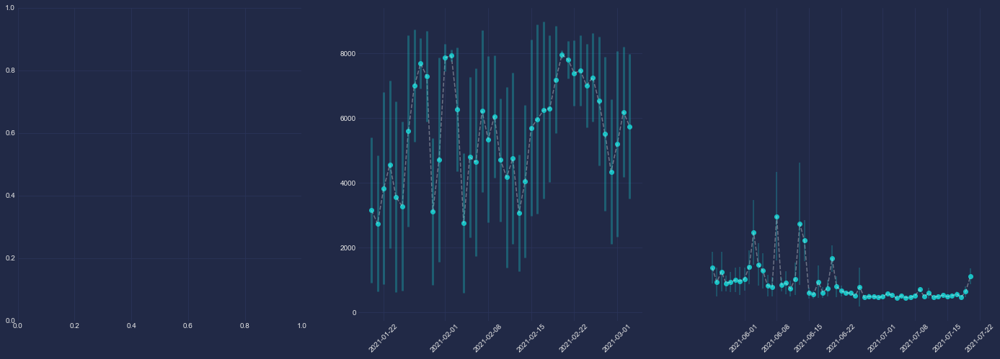

In [44]:
param = 'Equivalent Carbon Dioxide Digital Indoor Sensor'
device = 13545
multigraph_smartcitizen(device, param, gdf, gdf_est, edges, save=False)

In [96]:
def multigraph_smartcitizen(device, param, gdf, gdf_est, edges, save=False):
    
    df_temp = gdf[(gdf['device_id']==device) & (gdf['param']==param)].copy()
    df_temp['date'] = pd.to_datetime(df_temp['date'])
    df_temp.set_index('date',inplace=True)
    df_temp = df_temp.resample('D').agg({'value':['mean','std']})
    df_temp.reset_index(inplace=True)
    df_temp['date'] = df_temp['date'].dt.date
    
    df_time1 = df_temp
    
    datelimit = pd.to_datetime("2021-04-01").date()
    
    if len(df_temp[df_temp['date']>datelimit]) > 0:
        
        fig, axes = plt.subplots(1,3,figsize=(24,8))
        
        df_time1 = df_temp[df_temp['date']<datelimit].dropna()
        
        #second period
        df_time2 = df_temp[df_temp['date']>datelimit].dropna()
        axes[2].scatter(df_time2.date, df_time2['value']['mean'], label=param)
        axes[2].plot(df_time2.date, df_time2['value']['mean'], '--', zorder=1, color='white', alpha=0.35)
        axes[2].errorbar(df_time2.date, df_time2['value']['mean'], df_time2['value']['std'], elinewidth=3,linestyle='None', zorder=2, alpha=0.2)

        axes[2].tick_params(axis='x',labelrotation=45)
        #axes[2].axes.get_yaxis().set_visible(False)
        axes[1].get_shared_y_axes().join(axes[1], axes[2])
        axes[2].set_yticklabels([])


    else:
    
        fig, axes = plt.subplots(1,2,figsize=(24,8))

    
    #first period
    axes[1].scatter(df_time1.date, df_time1['value']['mean'], label=param)
    axes[1].plot(df_time1.date, df_time1['value']['mean'], '--', zorder=1, color='white', alpha=0.35)
    axes[1].errorbar(df_time1.date, df_time1['value']['mean'], df_time1['value']['std'], elinewidth=3, linestyle='None', zorder=2, alpha=0.2)
    
    axes[1].tick_params(axis='x',labelrotation=45)
    
    plt.ylim(0, None)

    a00 = axes[0]
    shay = a00.get_shared_y_axes()
    shay.remove(a00)
    
    edges.plot(ax=axes[0], color='#e8e9eb',linewidth=0.1, zorder=-1)
    edges[(edges['highway']=='primary') | (edges['highway']=='secondary')].plot(ax=axes[0], color='#e8e9eb',linewidth=0.5, zorder=0)
    gdf_est.plot(ax=axes[0], color='k', alpha=0.85, zorder=1)
    gdf_est[gdf_est.index==device].plot(ax=axes[0], color='#ba0d38', alpha=0.85, zorder=2, markersize=90)
    axes[0].axis('off')
    estacion = device
    fecha_1 = df_temp.date.min().strftime("%Y-%m-%d")
    fecha_2 = df_temp.date.max().strftime("%Y-%m-%d")
    fig.suptitle(f'Device: {estacion}\nEquivalent Carbon Dioxide (ppm)\n{fecha_1} -- {fecha_2}', fontsize=20)

    if save==True:
        plt.savefig(f'../output/figures/co2_smartcitizen/{device}_{fecha_1}_{fecha_2}.png',dpi=300)

    return plt.show()

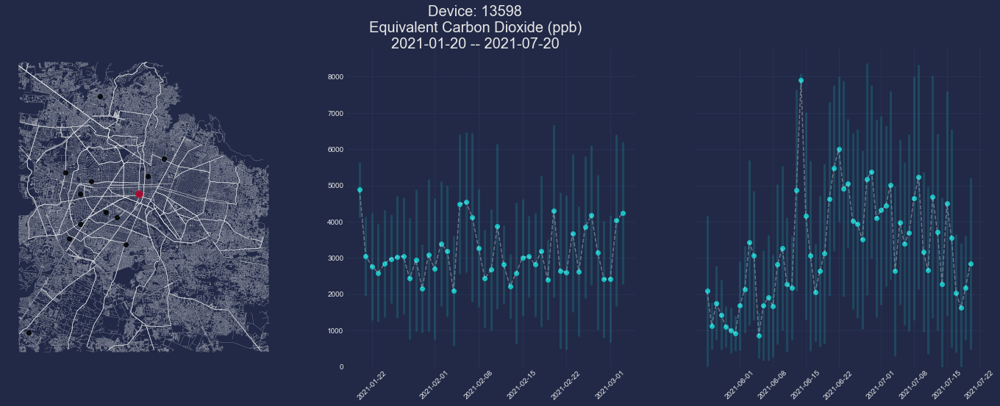

In [94]:
param = 'Equivalent Carbon Dioxide Digital Indoor Sensor'

multigraph_smartcitizen(13598, param, gdf, gdf_est, edges, save=False)

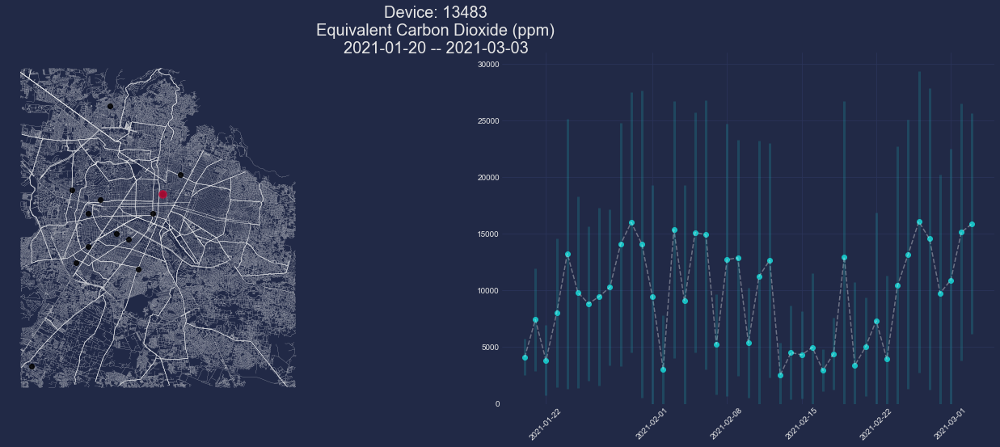

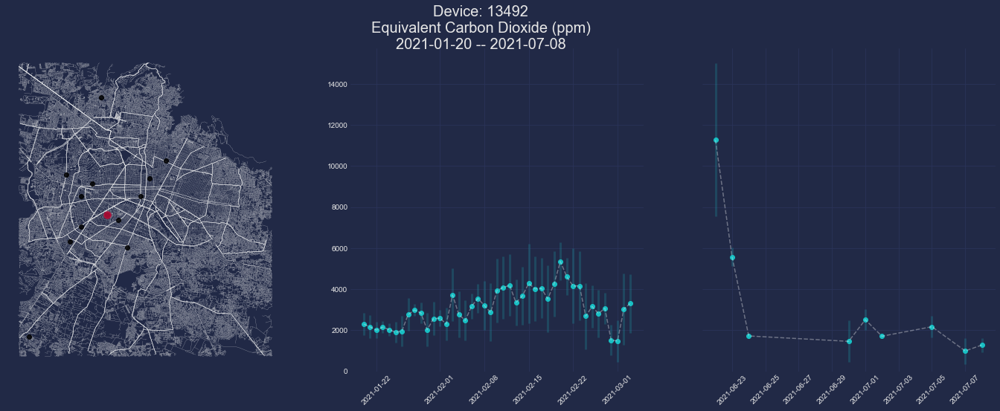

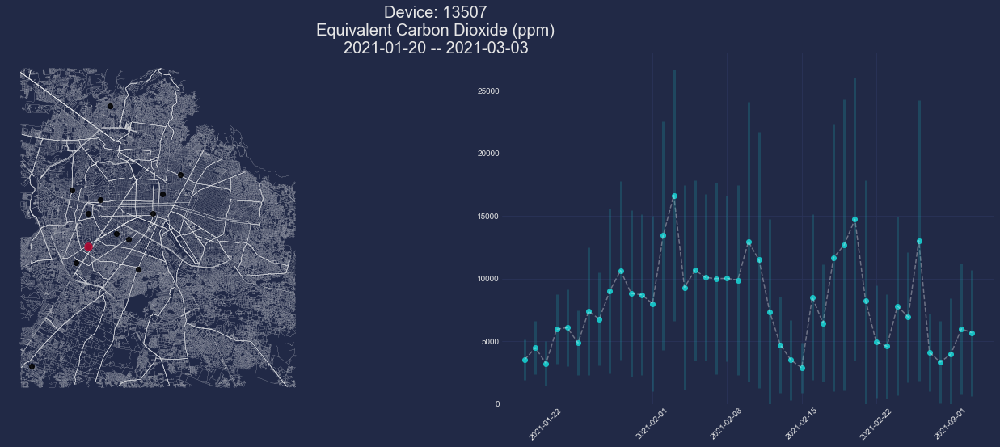

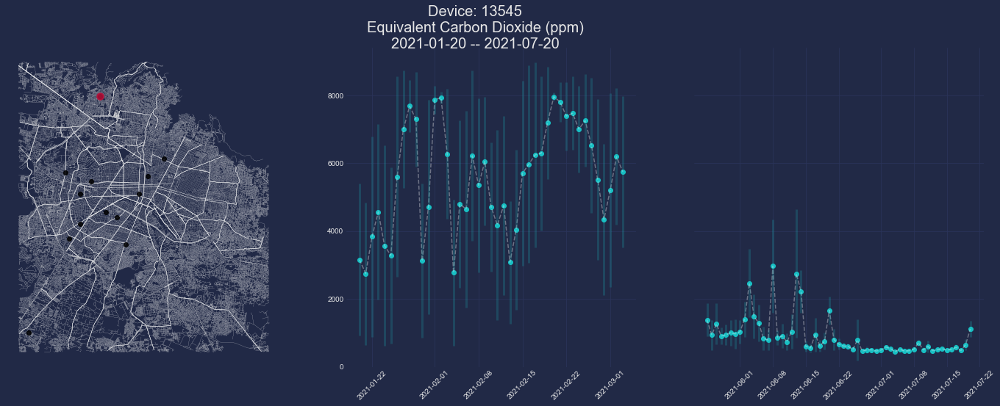

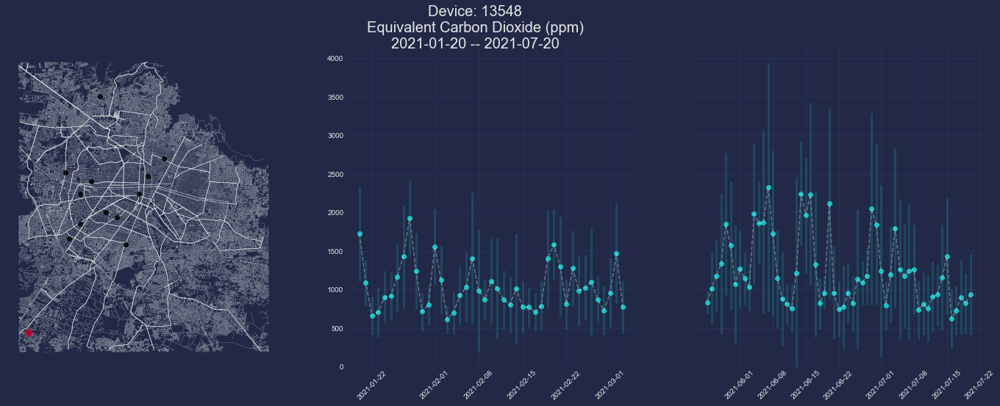

...

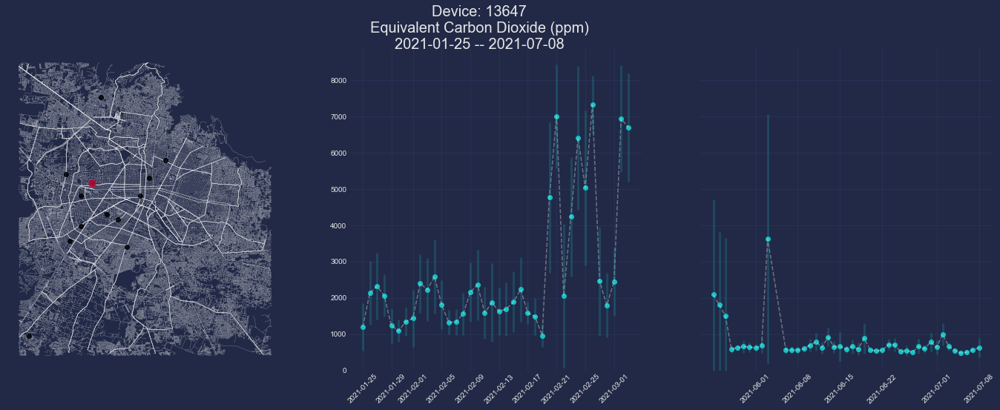

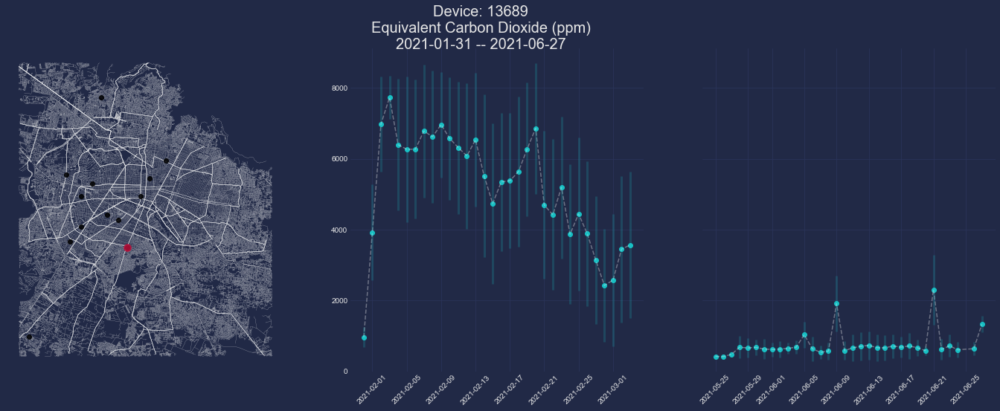

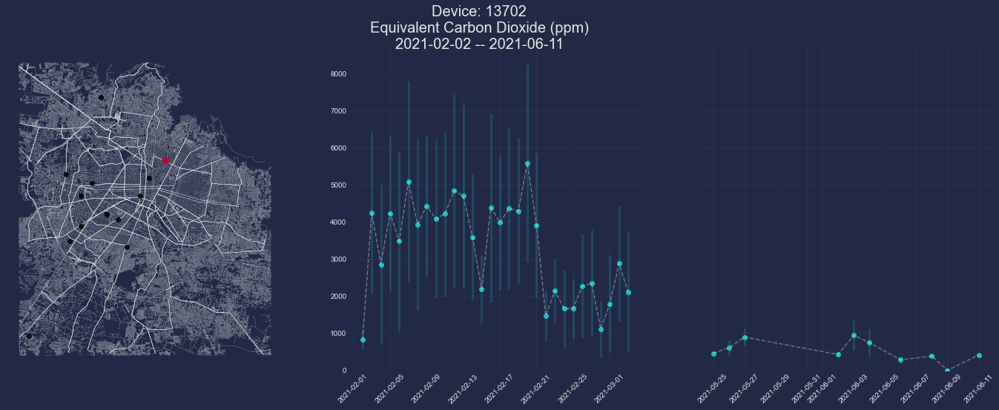

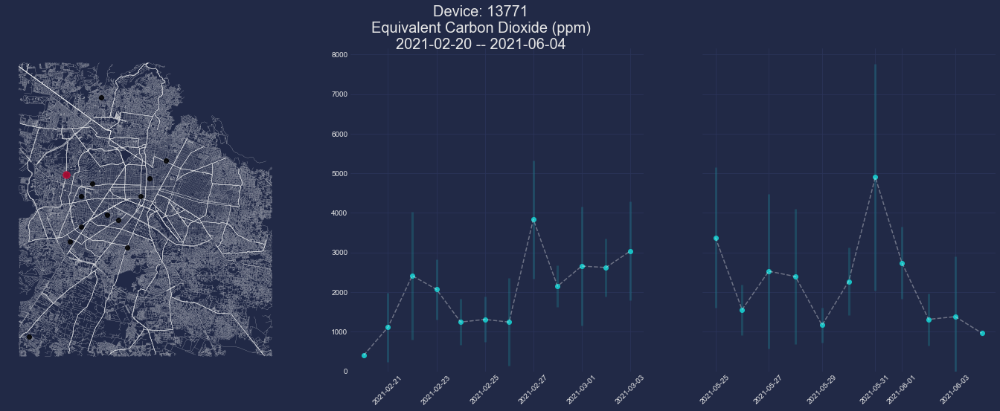

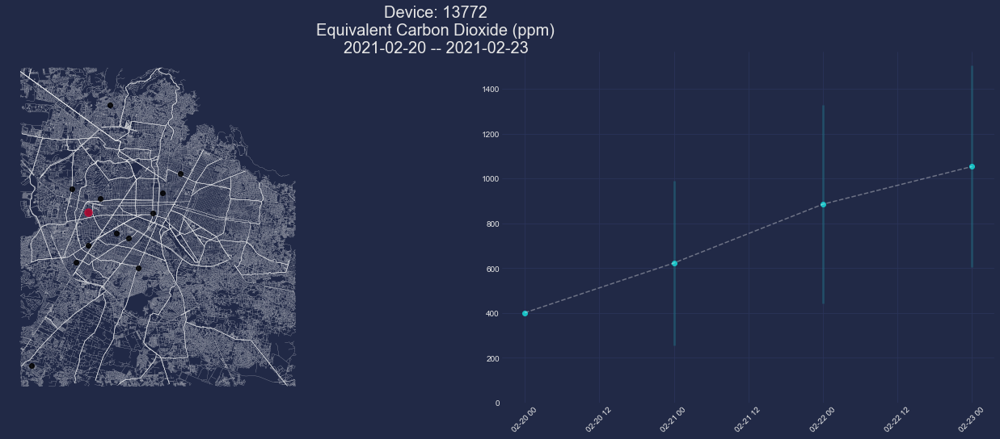

In [97]:
param = 'Equivalent Carbon Dioxide Digital Indoor Sensor'

for est in gdf.device_id.unique():
    multigraph_smartcitizen(est, param, gdf, gdf_est, edges, save=True)